In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np 
import pandas as pd
import time

import scipy.stats as scs 
import statsmodels.api as sm


from sklearn.linear_model import LinearRegression, Ridge, Lasso 
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import KFold

from IPython.core.display import HTML
from IPython.display import IFrame
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import statsFunctions as sf
import plotly.offline as pyo
import openbrewerydb
from geopy import distance
import pickle

pyo.init_notebook_mode()
%matplotlib inline

### Need to remove price outliers for model - kept in for eda and mapping

In [2]:
df = pd.read_csv(r"../data/cleaned_data.csv")

In [3]:
breweries = pd.read_csv('../data/breweries.csv')

In [4]:
water_quarter = pd.read_csv('../data/water_quarter.csv')

In [5]:
water_quarter.waterfront = water_quarter.waterfront.fillna(0.0)

In [6]:
water_quarter.waterfront.isna().sum()

0

In [7]:
breweries.name

0          Cloudburst Brewing
1          Fremont Brewing Co
2    Holy Mountain Brewing Co
3    Optimism Brewing Company
4      Reuben's Brews Taproom
5        Urban Family Brewing
Name: name, dtype: object

In [8]:
# remove unnamed index column from cleaned_data.csv
df.drop(df.columns[0], axis=1, inplace=True)
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,bed_to_bath,has_basement
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,...,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,3.000000,0.0
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,1.333333,1.0
2,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,1.333333,1.0
3,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,1.500000,0.0
4,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,...,0.0,1995,0.0,98003,47.3097,-122.327,2238,6819,1.333333,0.0


In [9]:
# remove unnamed index column from breweries.csv
breweries.drop(breweries.columns[0], axis=1, inplace=True)
breweries.head()

,id,name,brewery_type,street,city,state,postal_code,country,longitude,latitude,phone,website_url,updated_at
0,7405,Cloudburst Brewing,micro,2116 Western Ave,Seattle,Washington,98121-2110,United States,-122.345272,47.611614,2066026061,http://www.cloudburstbrew.com,2018-08-24T16:33:34.739Z
1,7475,Fremont Brewing Co,regional,3409 Woodland Park Ave N,Seattle,Washington,98103-8925,United States,-122.344437,47.649192,2064202407,http://www.fremontbrewing.com,2018-08-24T16:35:05.351Z
2,7505,Holy Mountain Brewing Co,micro,1421 Elliott Ave W,Seattle,Washington,98119-3104,United States,-122.374561,47.630828,2064988435,http://holymountainbrewing.com,2018-08-24T16:35:45.468Z
3,7599,Optimism Brewing Company,micro,1158 Broadway,Seattle,Washington,98122-3822,United States,-122.320267,47.612720,2062289227,http://www.optimismbrewing.com,2018-08-11T21:40:22.865Z
4,7639,Reuben's Brews Taproom,micro,5010 14th Ave NW,Seattle,Washington,98107-5113,United States,-122.373247,47.665409,2067842859,http://www.reubensbrews.com,2018-08-24T16:38:39.980Z


In [10]:
df_under_1m = df[df.price < 1000000]
df_under_1m.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,bed_to_bath,has_basement
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,...,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,3.000000,0.0
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,1.333333,1.0
2,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,1.333333,1.0
3,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,1.500000,0.0
4,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,...,0.0,1995,0.0,98003,47.3097,-122.327,2238,6819,1.333333,0.0


In [11]:
limits = []
for block in sf.gen_range(0, 1600000, 200000):
    limits.append(block)
colors = ["rgb(225,196,164)","rgb(225,196,164)","rgb(225,196,164)","rgb(200,133,119)","rgb(200,133,119)","rgb(153,74,93)","rgb(123,52,80)","rgb(92,35,67)"]
scale = 85000
# scale = 150

fig = go.Figure()

for i in range(len(limits)):
    lim = limits[i]
    df_sub = df[(df['price'] >= lim[0]) & (df['price'] <= lim[1])]
#     [(df['price'] >= 0) & (df['price'] <= 500000)]
    fig.add_trace(go.Scattermapbox(
            lat=df_sub.lat,
            lon=df_sub.long,
#             mode='markers',
            marker = dict(
            size = df_sub['price']/scale,
            color = colors[i],
#             line_color='rgb(40,40,40)',
#             line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])
        ))

# fig.add_trace(go.Scattermapbox(
#         lat=burbs.lat,
#         lon=burbs.long,
#         mode='markers',
#         marker=go.scattermapbox.Marker(
#             size=8,
#             color='rgb(191, 96, 64)',
#             opacity=0.7
#         ),

#         hoverinfo='none'
#     ))

fig.add_trace(go.Scattermapbox(
        hovertext=breweries.name,
        lat=breweries.latitude,
        lon=breweries.longitude,
        mode='markers',
        marker_symbol='alcohol-shop',
        name='Breweries',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),

        
    ))

fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        marker_symbol='hospital',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),

        name="University of Washington Medical Center"
    ))
fig.update_layout(
    title='Tiered Pricing of SKing County Homes',
    autosize=True,
    hovermode='closest',
    showlegend=True,
    height = 800,
    width = 1200,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        center=dict(
            lat=47.65,
            lon=-122.3
        ),
        pitch=0,
        zoom=10.2,
        style='dark'
    ),
)

fig.show()

In [12]:
df['coords'] = list(zip(df.lat, df.long))
breweries['coords'] = list(zip(breweries.latitude, breweries.longitude))

In [13]:
distance.distance(df.coords[0], breweries.coords[0]).miles

8.072272203248211

In [14]:
def get_miles(coord1, coord2):
    miles = distance.distance(coord1, coord2).miles
    return round(miles, 2)

In [15]:
for ind,row in breweries.iterrows():
    df[row['name']] = df['coords'].apply(lambda x: get_miles(row.coords, x))

In [16]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'bed_to_bath',
       'has_basement', 'coords', 'Cloudburst Brewing', 'Fremont Brewing Co',
       'Holy Mountain Brewing Co', 'Optimism Brewing Company',
       'Reuben's Brews Taproom', 'Urban Family Brewing'],
      dtype='object')

In [17]:
brew_dist = df.iloc[:,-6:]

In [18]:
brew_dist['closest'] = brew_dist.idxmin(axis=1)

In [19]:
brew_dist['closest_dist'] = brew_dist.min(axis=1)

In [20]:
df['closest'] = brew_dist['closest']
df['closest_dist'] = brew_dist['closest_dist']

In [21]:
# setting aside df with distances from breweries from all houses to use with model later
with open('../data/brew_distances.pkl', 'wb') as f:
    pickle.dump(df, f)

In [22]:
optimism = df[(df.closest == 'Optimism Brewing Company') & (df.closest_dist <= 10)]
reubens = df[(df.closest == 'Reuben\'s Brews Taproom') & (df.closest_dist <= 10)]
cloud = df[(df.closest == 'Cloudburst Brewing') & (df.closest_dist <= 10)]
holy = df[(df.closest == 'Holy Mountain Brewing Co') & (df.closest_dist <= 10)]
fremont = df[(df.closest == 'Fremont Brewing Co') & (df.closest_dist <= 10)]
urban = df[(df.closest == 'Urban Family Brewing') & (df.closest_dist <= 10)]


In [23]:
brew_radi_df = df[df.closest_dist <= 2]

In [24]:
brew_radi_df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,has_basement,coords,Cloudburst Brewing,Fremont Brewing Co,Holy Mountain Brewing Co,Optimism Brewing Company,Reuben's Brews Taproom,Urban Family Brewing,closest,closest_dist
11,1175000570,3/12/2015,530000.0,5,2.00,1810,4850,1.5,0.0,0.0,...,0.0,"(47.67, -122.394)",4.63,2.72,2.85,5.25,1.02,0.67,Urban Family Brewing,0.67
13,6865200140,5/29/2014,485000.0,4,1.00,1600,4300,1.5,0.0,0.0,...,0.0,"(47.6648, -122.343)",3.68,1.08,2.77,3.75,1.41,2.23,Fremont Brewing Co,1.08
21,1794500383,6/26/2014,937000.0,3,1.75,2450,2691,2.0,0.0,0.0,...,1.0,"(47.6386, -122.36)",1.99,1.03,0.87,2.58,1.95,2.08,Holy Mountain Brewing Co,0.87
22,3303700376,12/1/2014,667000.0,3,1.00,1400,1581,1.5,0.0,0.0,...,0.0,"(47.6221, -122.314)",1.63,2.35,2.89,0.71,4.07,4.45,Optimism Brewing Company,0.71
27,461000390,6/24/2014,687500.0,4,1.75,2330,5000,1.5,0.0,0.0,...,1.0,"(47.6823, -122.368)",5.00,2.54,3.57,5.30,1.19,1.83,Reuben's Brews Taproom,1.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15363,2767600688,11/13/2014,414500.0,2,1.50,1210,1278,2.0,0.0,0.0,...,1.0,"(47.6756, -122.375)",4.63,2.32,3.09,5.04,0.71,1.26,Reuben's Brews Taproom,0.71
15367,1931300412,4/16/2015,475000.0,3,2.25,1190,1200,3.0,0.0,0.0,...,0.0,"(47.6542, -122.346)",2.94,0.35,2.09,3.11,1.49,2.11,Fremont Brewing Co,0.35
15370,1972201967,10/31/2014,520000.0,2,2.25,1530,981,3.0,0.0,0.0,...,1.0,"(47.6533, -122.346)",2.88,0.29,2.05,3.05,1.52,2.13,Fremont Brewing Co,0.29
15383,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,...,0.0,"(47.5944, -122.299)",2.47,4.34,4.34,1.61,6.01,6.25,Optimism Brewing Company,1.61


In [25]:
brew_radi_df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'bed_to_bath',
       'has_basement', 'coords', 'Cloudburst Brewing', 'Fremont Brewing Co',
       'Holy Mountain Brewing Co', 'Optimism Brewing Company',
       'Reuben's Brews Taproom', 'Urban Family Brewing', 'closest',
       'closest_dist'],
      dtype='object')

In [26]:
fig = px.scatter_mapbox(brew_radi_df, lat="lat", 
                        lon="long", 
                        color="closest_dist", 
                        size="price",
                        color_discrete_sequence=["rgb(206,159,52)", "rgb(237, 246, 249)", "rgb(96, 87, 112)", "rgb(97,167,33)", "rgb(220,57,116)", 'rgb(247, 196, 165)'], 
                        size_max=7, 
                        zoom=10)

fig.add_trace(go.Scattermapbox(
        hovertext=breweries.name,
        lat=breweries.latitude,
        lon=breweries.longitude,
        mode='markers',
        showlegend=False,
        marker_symbol='alcohol-shop',
        name='Breweries',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),

        
    ))

fig.update_layout(
    title='Radius of Homes to Breweries',
    autosize=True,
    hovermode='closest',
    showlegend=True,
    height = 800,
    width = 1200,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        center=dict(
            lat=47.649,
            lon=-122.344
        ),
        pitch=0,
        zoom=11.2,
        style='dark'
    ),
)

fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        showlegend=False,
        marker_symbol='hospital',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.5
        ),

        name="University of Washington Medical Center"
    ))

fig.show()

In [27]:
fig = px.scatter_mapbox(water_quarter, lat="lat", 
                        lon="long", 
                        color="waterfront", 
                        size="price",
                        color_discrete_sequence=["rgb(206,159,52)", "rgb(237, 246, 249)", "rgb(96, 87, 112)", "rgb(97,167,33)", "rgb(220,57,116)", 'rgb(247, 196, 165)'], 
                        size_max=7, 
                        zoom=10)

fig.add_trace(go.Scattermapbox(
        hovertext=breweries.name,
        lat=breweries.latitude,
        lon=breweries.longitude,
        mode='markers',
        showlegend=False,
        marker_symbol='alcohol-shop',
        name='Breweries',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.7
        ),

        
    ))

fig.update_layout(
    title='Waterfront Homes within 1/4 Mile',
    autosize=True,
    hovermode='closest',
    height = 800,
    width = 1200,
    showlegend=True,
    mapbox=dict(
        accesstoken='pk.eyJ1IjoianVpY28iLCJhIjoiY2tmd3M1dnBkMTNjczJzbjRsMXZxa2V2NiJ9.wU0oXg1rdRp3PtMP3Mdsnw',
        bearing=0,
        center=dict(
            lat=47.65,
            lon=-122.3
        ),
        pitch=0,
        zoom=10.2,
        style='dark'
    ),
)

fig.add_trace(go.Scattermapbox(
        lat=[47.650639],
        lon=[-122.309662],
        mode='markers',
        showlegend=False,
        marker_symbol='hospital',
        marker=go.scattermapbox.Marker(
            size=12,
            color='rgb(191, 96, 64)',
            opacity=0.5
        ),

        name="University of Washington Medical Center"
    ))

fig.show()

In [28]:
with open('../data/brew_radi_df.pkl', 'wb') as f:
    pickle.dump(brew_radi_df, f)
# brew_radi_df

In [29]:
with open('../data/breweries.pkl', 'wb') as f:
    pickle.dump(breweries, f)

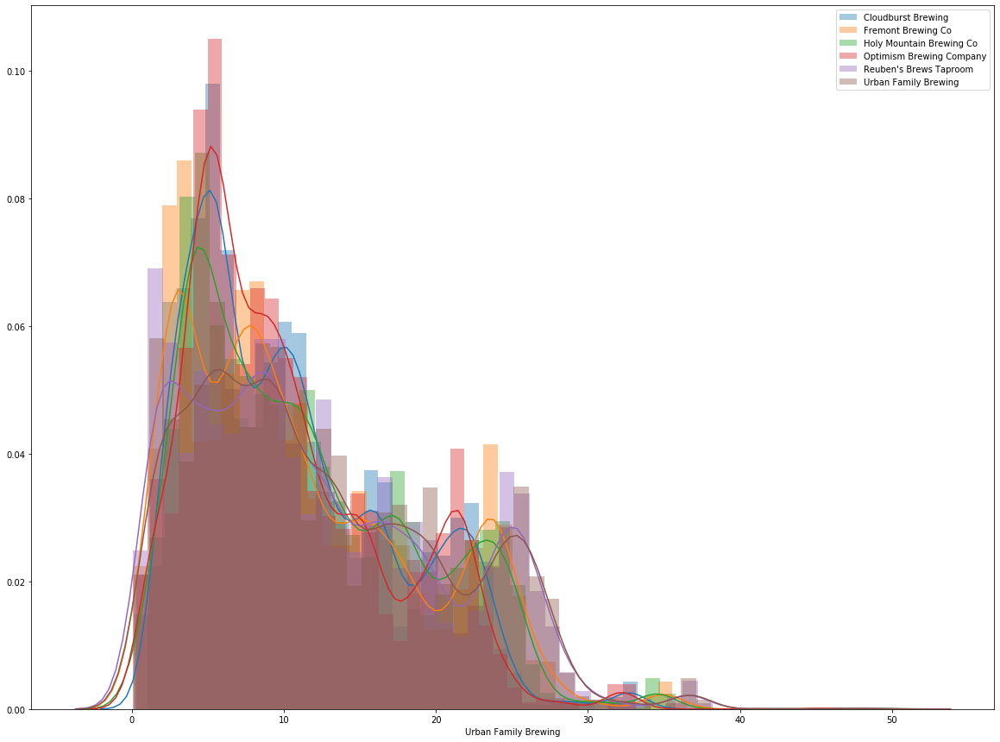

In [30]:
plt.figure(figsize=(20,15))
sns.distplot(df['Cloudburst Brewing'], label='Cloudburst Brewing')
sns.distplot(df['Fremont Brewing Co'], label='Fremont Brewing Co')
sns.distplot(df['Holy Mountain Brewing Co'], label='Holy Mountain Brewing Co')
sns.distplot(df['Optimism Brewing Company'], label='Optimism Brewing Company')
sns.distplot(df['Reuben\'s Brews Taproom'], label='Reuben\'s Brews Taproom')
sns.distplot(df['Urban Family Brewing'], label='Urban Family Brewing')
plt.legend()

In [31]:
scs.shapiro(df['Optimism Brewing Company'])

(0.926243245601654, 0.0)

In [32]:
brew_series = [
"df['Cloudburst Brewing']",
"df['Fremont Brewing Co']",
"df['Holy Mountain Brewing Co']",
"df['Optimism Brewing Company']",
"df['Reuben\'s Brews Taproom']",
"df['Urban Family Brewing']"
]

In [33]:
for ind, ser in enumerate(brew_series):
#     print(scs.shapiro(ser))
    print(ser)

df['Cloudburst Brewing']
df['Fremont Brewing Co']
df['Holy Mountain Brewing Co']
df['Optimism Brewing Company']
df['Reuben's Brews Taproom']
df['Urban Family Brewing']


In [34]:
fig = px.scatter(cloud, x="closest_dist", y="price", trendline="ols", trendline_color_override='red')
fig.show()

In [35]:
fig = px.scatter(df, x="closest_dist", y="price", trendline="ols", trendline_color_override='red')
fig.show()

In [36]:
fig = px.scatter(water_quarter, x="sqft_living", y="price", color='waterfront', trendline="ols", trendline_color_override='#bf9f3d')
fig2 = px.scatter(water_quarter, x="waterfront", y="price", color='waterfront', trendline="ols", trendline_color_override='#663837')


# grosscat = gross_df.sort_values(by='worldwide_gross', ascending=False).drop_duplicates(subset=['movie'], keep='last')
# grosscat = grosscat[(grosscat['domestic_gross'] != 0) & (grosscat['worldwide_gross'] != 0)]
# grosscat['profit'] = grosscat.worldwide_gross - grosscat.production_budget
# fig2 = px.scatter(grosscat, 
#                   x='production_budget',
#                   y='worldwide_gross', 
#                   trendline='ols', 
#                   trendline_color_override='#bf9f3d')
# fig3 = px.scatter(grosscat, 
#                   x='production_budget', 
#                   y='domestic_gross', 
#                   trendline='ols', 
#                   trendline_color_override='#663837')
trendline = fig2.data[1]

# fig = go.Figure(data=[
#     go.Scatter(name='World Wide',
#     hovertext=grosscat.movie, 
#     x=grosscat.production_budget, 
#     y=grosscat.worldwide_gross, 
#     mode='markers',
#     marker=dict(color='burlywood',
#                 size=10,opacity=0.9, 
#                 line=dict(width=0.5, 
#                           color='seashell'))),
#     go.Scatter(name='Domestic', 
#                hovertext=grosscat.movie, 
#                x=grosscat.production_budget, 
#                y=grosscat.domestic_gross, 
#                mode='markers',
#                marker=dict(color='#b36360',
#                            size=10,
#                            opacity=0.9, 
#                            line=dict(width=0.5, 
#                                      color='seashell'))),

# ])
fig.add_trace(trendline)
# fig.add_trace(trendline2)

# fig.update_layout(title=dict(text='Budget vs Revenue by Movie', 
#                              y=0.98,x=0.5, 
#                              xanchor='center', 
#                              yanchor='auto'), 
#                   xaxis_title="Production Budget",
#                   yaxis_title="Gross Revenue",
#                   plot_bgcolor='lightslategrey',
#                   paper_bgcolor='ivory', 
#                   width=800, 
#                   height=500)

fig.update_traces(marker=dict(line=dict(width=2, 
                                        color='seashell')),
                  selector=dict(type='bar')) # marker_color="black"
fig.show()

In [37]:
ols = sf.check_model(water_quarter, features_to_use=['waterfront', 'grade'], target_col='price', show_summary=True)
ols

                                 OLS Regression Results                                
Dep. Variable:                  price   R-squared (uncentered):                   0.783
Model:                            OLS   Adj. R-squared (uncentered):              0.783
Method:                 Least Squares   F-statistic:                          3.896e+04
Date:                Sun, 18 Oct 2020   Prob (F-statistic):                        0.00
Time:                        19:09:08   Log-Likelihood:                     -3.0333e+05
No. Observations:               21597   AIC:                                  6.067e+05
Df Residuals:                   21595   BIC:                                  6.067e+05
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [38]:
df.iloc[:,-6:]

,Holy Mountain Brewing Co,Optimism Brewing Company,Reuben's Brews Taproom,Urban Family Brewing,closest,closest_dist
0,9.93,7.61,11.96,12.06,Optimism Brewing Company,7.61
1,6.75,7.48,4.60,5.34,Reuben's Brews Taproom,4.60
2,7.65,7.20,10.03,9.66,Cloudburst Brewing,6.66
3,15.42,12.86,15.69,16.40,Optimism Brewing Company,12.86
4,22.30,20.94,24.67,24.42,Cloudburst Brewing,20.87
...,...,...,...,...,...,...
15381,4.91,6.10,2.66,3.38,Reuben's Brews Taproom,2.66
15382,8.32,7.31,10.70,10.44,Cloudburst Brewing,7.02
15383,4.34,1.61,6.01,6.25,Optimism Brewing Company,1.61
15384,15.76,12.93,16.85,17.36,Optimism Brewing Company,12.93


In [39]:
ols = sf.check_model(brew_radi_df, features_to_use=['Optimism Brewing Company', 'grade'], target_col='price', show_summary=True)
ols

Optimism Brewing Company surpassed threshold with vif=4.392867719789301
grade surpassed threshold with vif=4.392867719789304
Model contains multicollinear features
                                 OLS Regression Results                                
Dep. Variable:                  price   R-squared (uncentered):                   0.875
Model:                            OLS   Adj. R-squared (uncentered):              0.875
Method:                 Least Squares   F-statistic:                              8849.
Date:                Sun, 18 Oct 2020   Prob (F-statistic):                        0.00
Time:                        19:09:09   Log-Likelihood:                         -35090.
No. Observations:                2521   AIC:                                  7.018e+04
Df Residuals:                    2519   BIC:                                  7.020e+04
Df Model:                           2                                                  
Covariance Type:            nonrobust       

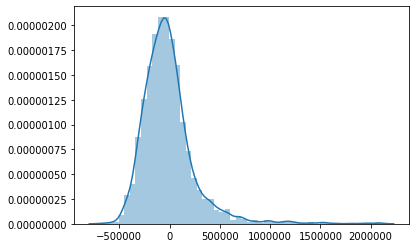

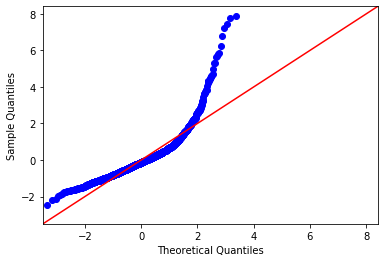

In [40]:
sns.distplot(ols.resid)
fig = sm.graphics.qqplot(ols.resid, dist=scs.norm, line='45', fit=True)

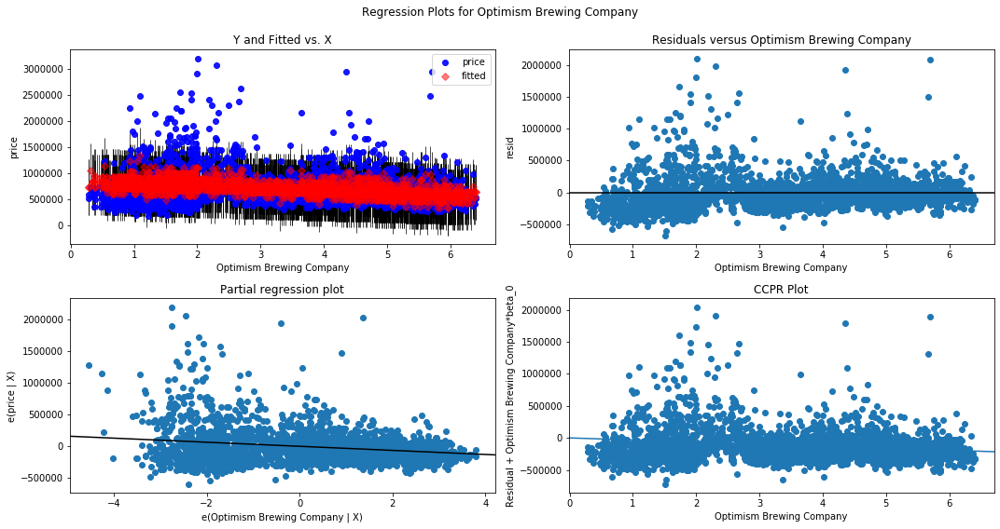

In [41]:
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(ols, 'Optimism Brewing Company', fig=fig)
plt.show()